## Fetching Data

We are using the Reddit API to fetch data from a bunch of programming, computer science and data science related subreddits.

In [3]:
# Import Libraries
import requests
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import string
import nltk
import html
import re
import math
import contractions
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import ipywidgets as widgets
import numpy as np
warnings.filterwarnings('ignore')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/lucifer/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/lucifer/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [4]:
# Define Subreddit List
subreddits = ['python', 'datascience', 'javascript', 'linux', 'opensource', 'node', 'programming', 'computerscience', 'webdev', 'statistics', 'MachineLearning', 'compsci', 'java', 'rust', 'typescript']

In [5]:
# Progress Bar Display Function
def progress (iteration, total, fill = '█'):
    printEnd = "\r"
    prefix = 'Downloading Data'
    suffix = 'Complete'
    decimals = 2
    length = 50
    downloaded = 100 * (iteration / float(total))
    percent = ("{0:." + str(decimals) + "f}").format(downloaded) if downloaded <= 100 else 100
    filledLength = int(length * iteration // total)
    bar = fill * filledLength + '-' * (length - filledLength)
    if downloaded <= 100:
        print(f'\r{prefix} |{bar}| {percent}% {suffix}', end = printEnd)

# Data Fetcher Class
class DataFetcher:
    posts = []
    after = None
    posts_per_subreddit = 1000
    downloaded = 0

    def __init__(self):
        client_id = 'dog1LGxsD9M3bXtglOzKsQ'
        client_secret = 'nc-HHPBGtz51-_r4vNLGcuCHmT39Lw'
        username = 'NoSeason1949'
        password = 'Password@1234'
        auth = requests.auth.HTTPBasicAuth(client_id, client_secret)
        data = {
            'grant_type': 'password',
            'username': username,
            'password': password,
        }
        headers = {'User-Agent': 'RedditTest/0.1 by {}'.format(username)}
        res = requests.post('https://www.reddit.com/api/v1/access_token',
                            auth=auth, data=data, headers=headers)
        self.token = res.json()['access_token']
        self.headers = {**headers, **{'Authorization': f"bearer {self.token}"}}
        self.subreddits = subreddits

    def fetch(self):
        for subreddit in self.subreddits:
            subreddit_download = 0
            while subreddit_download < self.posts_per_subreddit:
                url = f"https://oauth.reddit.com/r/{subreddit}/hot?limit=100"
                if self.after:
                     url += f"&after={self.after}"
                res = requests.get(url, headers=self.headers)
                if res.status_code == 200:
                    data = res.json()
                    for post in data['data']['children']:
                        self.posts.append(post['data'])
                        subreddit_download += 1
                        self.downloaded += 1
                        progress(self.downloaded, len(subreddits) * self.posts_per_subreddit)
                    self.after = data['data']['after']
                else:
                    print('Failed on subreddit: {}, with status code: {}'.format(subreddit, res.status_code))
                    break

    def get_data(self):
        return self.posts

# Fetch Data
data_fetcher = DataFetcher()
data_fetcher.fetch()


In [6]:
# Dataframe
df = pd.DataFrame(data_fetcher.get_data())
df.head()

,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,...,url_overridden_by_dest,preview,media_metadata,author_cakeday,call_to_action,crosspost_parent_list,crosspost_parent,poll_data,is_gallery,gallery_data
0,None,Python,Tell /r/python what you're working on this wee...,t2_145f96,False,None,0,False,Sunday Daily Thread: What's everyone working o...,"[{'e': 'text', 't': 'Daily Thread'}]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,None,Python,Discussion of using Python in a professional e...,t2_145f96,False,None,0,False,"Thursday Daily Thread: Python Careers, Courses...","[{'e': 'text', 't': 'Daily Thread'}]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,None,Python,,t2_1wi1cv4l,False,None,0,False,Pydantic 2 rewritten in Rust was merged,"[{'e': 'text', 't': 'News'}]",...,https://github.com/pydantic/pydantic/pull/4516,{'images': [{'source': {'url': 'https://extern...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,None,Python,"Hello,\n\nIf you are interested in automatic s...",t2_4z4m2qcs,False,None,0,False,How to install and deploy OpenAI Whisper with ...,"[{'e': 'text', 't': 'Tutorial'}]",...,NaN,{'images': [{'source': {'url': 'https://extern...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,None,Python,**Github:** [https://github.com/m-barker/fibs-...,t2_82cxy0sa,False,None,0,False,Automatically generate a PDF Report summarisin...,"[{'e': 'text', 't': 'Intermediate Showcase'}]",...,NaN,{'images': [{'source': {'url': 'https://extern...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
# Check Shape
df.shape

(15762, 118)

In [8]:
# Dtypes
df.dtypes

approved_at_utc          object
subreddit                object
selftext                 object
author_fullname          object
saved                      bool
                          ...  
crosspost_parent_list    object
crosspost_parent         object
poll_data                object
is_gallery               object
gallery_data             object
Length: 118, dtype: object

## Data Cleaning & Preprocessing

We are going to preprocess the data by removing the stop words, punctuations and lemmatizing the words.

In [9]:
# Print Column Values
print(list(df.columns.values))

['approved_at_utc', 'subreddit', 'selftext', 'author_fullname', 'saved', 'mod_reason_title', 'gilded', 'clicked', 'title', 'link_flair_richtext', 'subreddit_name_prefixed', 'hidden', 'pwls', 'link_flair_css_class', 'downs', 'thumbnail_height', 'top_awarded_type', 'hide_score', 'name', 'quarantine', 'link_flair_text_color', 'upvote_ratio', 'author_flair_background_color', 'subreddit_type', 'ups', 'total_awards_received', 'media_embed', 'thumbnail_width', 'author_flair_template_id', 'is_original_content', 'user_reports', 'secure_media', 'is_reddit_media_domain', 'is_meta', 'category', 'secure_media_embed', 'link_flair_text', 'can_mod_post', 'score', 'approved_by', 'is_created_from_ads_ui', 'author_premium', 'thumbnail', 'edited', 'author_flair_css_class', 'author_flair_richtext', 'gildings', 'content_categories', 'is_self', 'mod_note', 'created', 'link_flair_type', 'wls', 'removed_by_category', 'banned_by', 'author_flair_type', 'domain', 'allow_live_comments', 'selftext_html', 'likes', '

In [10]:
# Finding Saturated Columns – Columns with same values in all rows
saturated_cols = []
for col in df.columns:
    first_value = df[col].iloc[0]
    if df[col].equals(pd.Series([first_value] * len(df[col]))):
        saturated_cols.append(col)

print(saturated_cols)

# At this point, we can drop the saturated columns as they don't provide any useful information
df.drop(saturated_cols, axis=1, inplace=True)

['approved_at_utc', 'saved', 'mod_reason_title', 'clicked', 'hidden', 'pwls', 'downs', 'top_awarded_type', 'quarantine', 'subreddit_type', 'user_reports', 'is_meta', 'can_mod_post', 'approved_by', 'is_created_from_ads_ui', 'content_categories', 'mod_note', 'removed_by_category', 'banned_by', 'likes', 'banned_at_utc', 'view_count', 'is_crosspostable', 'pinned', 'awarders', 'media_only', 'treatment_tags', 'visited', 'removed_by', 'num_reports', 'author_is_blocked', 'mod_reason_by', 'removal_reason', 'is_robot_indexable', 'report_reasons', 'discussion_type', 'mod_reports', 'parent_whitelist_status']


In [11]:
# Replace all NaN values with 0 if the column is numeric or empty string if the column is string
for col in df.columns:
    if df[col].dtype == 'float64' or df[col].dtype == 'int64':
        df[col].fillna(0, inplace=True)
    if df[col].dtype == 'object':
        df[col].fillna('', inplace=True)

In [12]:
# Convert column to string if column is not numeric or boolean
for col in df.columns:
    if df[col].dtype != 'float64' and df[col].dtype != 'int64' and df[col].dtype != 'bool':
        df[col] = df[col].astype(str)

In [13]:
# Check for title duplicates
print('Duplicate titles: {}'.format(df['title'].duplicated().sum()))

# Same post data can be repeated from the API -Delete titles that appear more than once
df.drop_duplicates(subset=['title'], keep='first', inplace=True)

Duplicate titles: 7100


In [14]:
# Print columns with missing values and their count - Should be empty list, ie. no missing values
print(list(df.isnull().sum()[df.isnull().sum() > 0]))

[]


In [15]:
# Handling Flair Columns - We only need the flair texts

# Supplimentary Column Search Function
def search(array, search_term):
    """
    Returns a list of strings that contain the search term.
    """
    return [string for string in array if search_term in string]

# Find all columns that contain 'flair'
columns = list(df.columns)
flair_columns = search(columns, 'flair')
# remove everything from df columns except link_flair_text and author_flair_text
flair_columns = list(filter(lambda x: x not in ['link_flair_text', 'author_flair_text'], flair_columns))
df.drop(flair_columns, axis=1, inplace=True)

In [16]:
# Any rows containing [deleted] and [removed] are not useful for our analysis. Find any rows with these values and drop them.
columns = list(df.columns)
for column in columns:
    df = df[df[column] != '[deleted]']
    df = df[df[column] != '[removed]']

In [17]:
# Remove all posts which are polls - where poll_data is not ""
df = df[df['poll_data'] == '']

In [18]:
cols_to_drop = ['author_fullname', 'subreddit_name_prefixed', 'name', 'hide_score', 'media_embed', 'thumbnail_height', 'thumbnail_width', 'category', 'thumbnail', 'edited', 'gildings', 'wls', 'domain', 'allow_live_comments', 'selftext_html', 'suggested_sort', 'archived', 'all_awardings', 'can_gild', 'subreddit_id', 'id', 'whitelist_status', 'permalink', 'url', 'created', 'media', 'post_hint', 'preview', 'media_metadata', 'url_overridden_by_dest', 'call_to_action', 'author_cakeday', 'crosspost_parent_list', 'crosspost_parent', 'poll_data', 'is_gallery', 'gallery_data', 'secure_media', 'secure_media_embed']
df.drop(cols_to_drop, axis=1, inplace=True)

In [19]:
# "distinguished" coloumn has 2 values - "moderator" and "" - We can convert this to a boolean column
df['distinguished'] = df['distinguished'].apply(lambda x: True if x == 'moderator' else False)

In [20]:
# Convert author_premium to boolean
df['author_premium'] = df['author_premium'].apply(lambda x: True if x == True else False)

In [21]:
# Lowercasing the data
df = df.applymap(lambda s:s.lower() if type(s) == str else s)

In [22]:
# Text Preprocessing Functions
stop_words = stopwords.words('english')
lemmatizer = WordNetLemmatizer()
stemmer = nltk.stem.PorterStemmer()
punctuation = string.punctuation

def remove_html_entities(text):
    return html.unescape(text)

def remove_urls(text):
    return re.sub(r'http\S+', '', text)

def remove_emojis(text):
    emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U00002500-\U00002BEF"  # chinese char
        u"\U00002702-\U000027B0"
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"
        u"\u2640-\u2642" 
        u"\u2600-\u2B55"
        u"\u200d"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # dingbats
        u"\u3030"
                      "]+", re.UNICODE)
    return re.sub(emoji_pattern, '', text)

def remove_contractions(text):
    return contractions.fix(text)

def remove_extra_spaces_and_numbers(text):
    text = ''.join([i for i in text if not i.isdigit()])
    text =  " ".join(text.split())
    return text

def remove_punctuation(text):
    return text.translate(str.maketrans('', '', punctuation))

def remove_stop_words(text):
    return ' '.join([word for word in text.split() if word not in stop_words])

def lemmatize(text):
    return ' '.join([lemmatizer.lemmatize(word) for word in text.split()])

def stem(text):
    return ' '.join([stemmer.stem(word) for word in text.split()])

def preprocess(text):
    text = remove_html_entities(text)
    text = remove_urls(text)
    text = remove_emojis(text)
    text = remove_contractions(text)
    text = remove_extra_spaces_and_numbers(text)
    text = remove_punctuation(text)
    text = remove_stop_words(text)
    text = lemmatize(text)
    text = stem(text)
    return text

In [23]:
# Preprocess all text columns
text_columns = ['title', 'selftext', 'author_flair_text']
for column in text_columns:
    df[column] = df[column].apply(lambda x: preprocess(x))

# Remove emojis from flair text
df['link_flair_text'] = df['link_flair_text'].apply(lambda x: remove_emojis(x))

# Remove whitespace from flair text
df['link_flair_text'] = df['link_flair_text'].apply(lambda x: x.strip())

# Link flair text => '' -> None
df['link_flair_text'] = df['link_flair_text'].apply(lambda x: None if x == '' else x)
df['link_flair_text'].fillna('None', inplace=True)

In [24]:
# Print final list of columns and head of dataframe
print(list(df.columns.values))
df.head()

['subreddit', 'selftext', 'gilded', 'title', 'upvote_ratio', 'ups', 'total_awards_received', 'is_original_content', 'is_reddit_media_domain', 'link_flair_text', 'score', 'author_premium', 'is_self', 'no_follow', 'over_18', 'spoiler', 'locked', 'author_flair_text', 'distinguished', 'author', 'num_comments', 'send_replies', 'contest_mode', 'stickied', 'subreddit_subscribers', 'created_utc', 'num_crossposts', 'is_video']


,subreddit,selftext,gilded,title,upvote_ratio,ups,total_awards_received,is_original_content,is_reddit_media_domain,link_flair_text,...,distinguished,author,num_comments,send_replies,contest_mode,stickied,subreddit_subscribers,created_utc,num_crossposts,is_video
0,python,tell rpython work week brag grous share passio...,0,sunday daili thread everyon work week,0.84,15,0,False,False,daily thread,...,True,im__joseph,22,False,False,True,1062890,1.667088e+09,0,False
1,python,discuss use python profession environ get job ...,0,thursday daili thread python career cours furt...,1.00,5,0,False,False,daily thread,...,True,im__joseph,0,False,False,True,1062890,1.667434e+09,0,False
2,python,,0,pydant rewritten rust merg,0.97,58,0,False,False,news,...,False,confidentmushroom,7,True,False,False,1062890,1.667509e+09,0,False
3,python,hello interest automat speech recognit speecht...,0,instal deploy openai whisper python,0.94,107,0,False,False,tutorial,...,False,juliensalinas,24,True,False,False,1062890,1.667483e+09,0,False
4,python,github pypi data featur import baselinemodel s...,0,automat gener pdf report summaris key featur b...,1.00,21,0,False,False,intermediate showcase,...,False,thefunnychive,1,True,False,False,1062890,1.667492e+09,0,False


## Exploratory Data Analysis

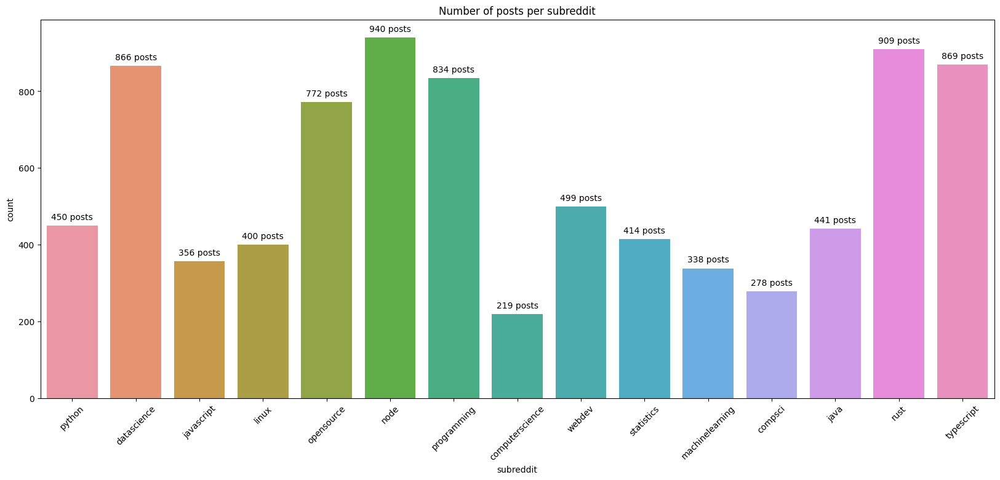

In [25]:
# Plot Number of posts per subreddit with the count of posts beside each bar
plt.figure(figsize=(20, 8))
plt.rcParams['figure.dpi'] = 300
plt.title('Number of posts per subreddit')
plt.xlabel('Subreddit')
plt.ylabel('Number of posts')
plt.xticks(rotation=45)
sns.countplot(x='subreddit', data=df)
for p in plt.gca().patches:
    plt.gca().annotate('{:1.0f} posts'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

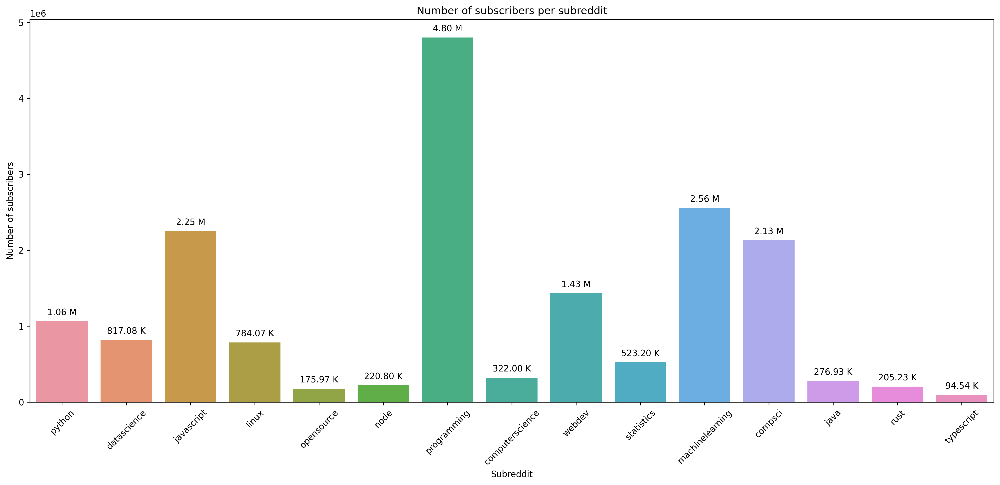

In [26]:
# Number of subscribers per subreddit
def pretty_number(number):
    # Convert number to in B, M, K format
    if number >= 1000000000:
        return '{:.2f} B'.format(number / 1000000000)
    elif number >= 1000000:
        return '{:.2f} M'.format(number / 1000000)
    elif number >= 1000:
        return '{:.2f} K'.format(number / 1000)
    else:
        return number

plt.figure(figsize=(20, 8))
plt.rcParams['figure.dpi'] = 300
sns.barplot(x='subreddit', y='subreddit_subscribers', data=df)
for p in plt.gca().patches:
    plt.gca().annotate('{}'.format(pretty_number(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                          ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.title('Number of subscribers per subreddit')
plt.xlabel('Subreddit')
plt.ylabel('Number of subscribers')
plt.xticks(rotation=45)
plt.show()

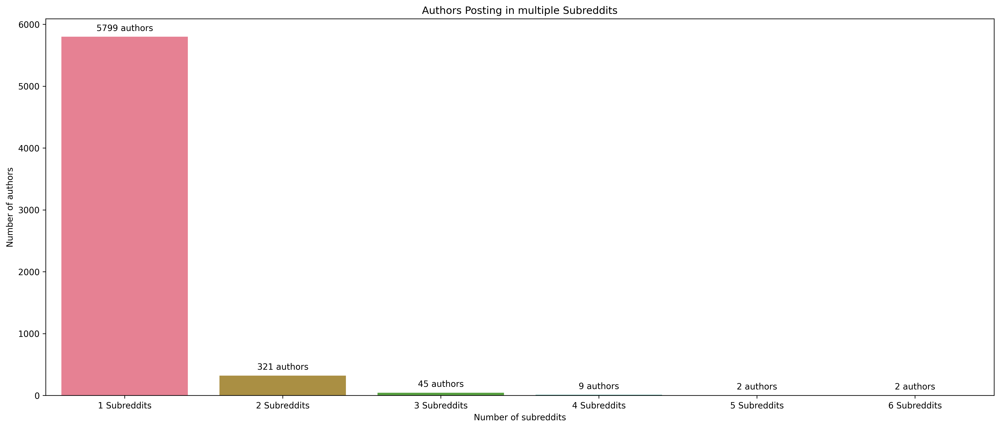

In [27]:
# Number of Authors who post in multiple subreddits
n_subreddits = df.groupby('author')['subreddit'].nunique()
plt.figure(figsize=(20, 8))
plt.rcParams['figure.dpi'] = 300
plt.title('Authors Posting in multiple Subreddits')
sns.countplot(x=n_subreddits, palette=sns.color_palette("husl"))
for p in plt.gca().patches:
    plt.gca().annotate('{:1.0f} authors'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                          ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

plt.xlabel('Number of subreddits')
plt.ylabel('Number of authors')
x_tick_labels = list(map(lambda x: '{} Subreddits'.format(x) if x > 1 else '{} Subreddits'.format(x), list(range(1, len(n_subreddits.unique()) + 1))))
plt.xticks(list(range(0, len(n_subreddits.unique()))), x_tick_labels)
plt.show()

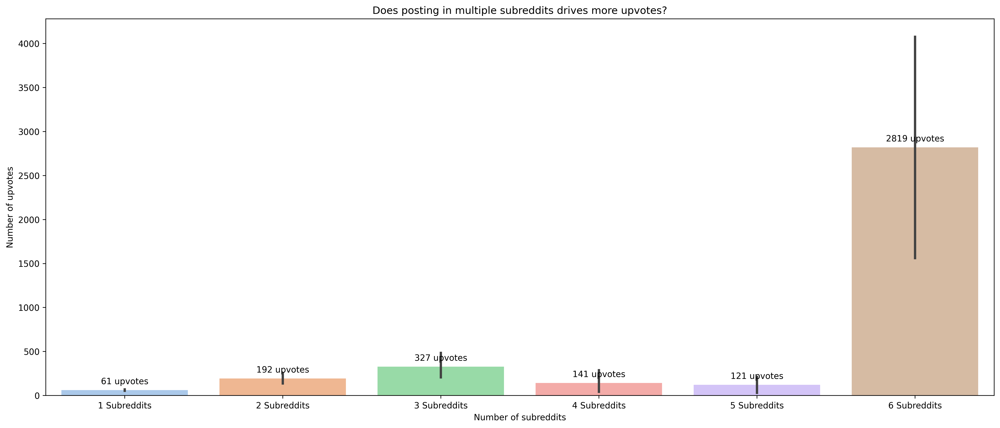

In [28]:
# Does posting in multiple subreddits drives more upvotes?
n_subreddits = df.groupby('author')['subreddit'].nunique()
n_upvotes = df.groupby('author')['score'].sum()
plt.figure(figsize=(20, 8))
plt.rcParams['figure.dpi'] = 300
sns.barplot(x=n_subreddits, y=n_upvotes, palette=sns.color_palette("pastel"))
for p in plt.gca().patches:
    plt.gca().annotate('{:1.0f} upvotes'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                          ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.title('Does posting in multiple subreddits drives more upvotes?')
plt.xlabel('Number of subreddits')
plt.ylabel('Number of upvotes')
x_tick_labels = list(map(lambda x: '{} Subreddits'.format(x) if x > 1 else '{} Subreddits'.format(x), list(range(1, len(n_subreddits.unique()) + 1))))
plt.xticks(list(range(0, len(n_subreddits.unique()))), x_tick_labels)
plt.show()


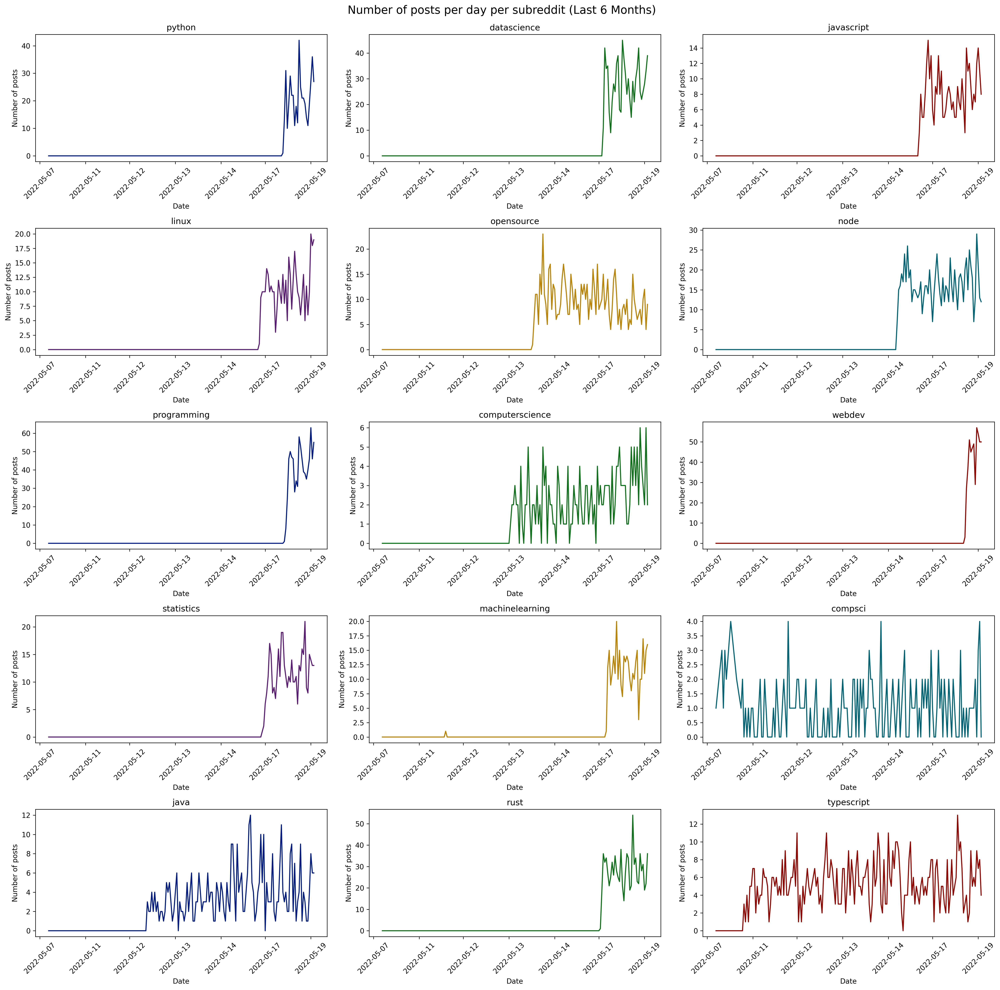

In [29]:
# Number of posts per day per subreddit
posts_df = df.groupby(['subreddit', 'created_utc']).size().reset_index(name='counts')
posts_df['created_utc'] = pd.to_datetime(posts_df['created_utc'], unit='s')
posts_df['created_utc'] = posts_df['created_utc'].dt.date
posts_df = posts_df.groupby(['subreddit', 'created_utc']).sum().reset_index()
posts_df = posts_df.pivot(index='created_utc', columns='subreddit', values='counts')
posts_df = posts_df.fillna(0)

# Select dates after 2021-01-01
import datetime
last_6M = datetime.date.today() - datetime.timedelta(days=180)
posts_df = posts_df.loc[posts_df.index >= last_6M]

# Plot number of posts per day per subreddit
subreddits = df['subreddit'].unique()
palette = sns.color_palette("dark6", len(subreddits))
fig, ax = plt.subplots(5, 3, figsize=(20, 20))
fig.set_dpi(300)
fig.suptitle('Number of posts per day per subreddit (Last 6 Months)\n', fontsize=16)
for i, subreddit in enumerate(subreddits):
    row = i // 3
    col = i % 3
    sns.lineplot(x=posts_df.index, y=subreddit, data=posts_df, ax=ax[row, col], color=palette[i])
    ax[row, col].set_title(subreddit)
    ax[row, col].set_xlabel('Date')
    ax[row, col].set_ylabel('Number of posts')
    ax[row, col].set_xticklabels(posts_df.index, rotation=45)
plt.tight_layout()
plt.show()

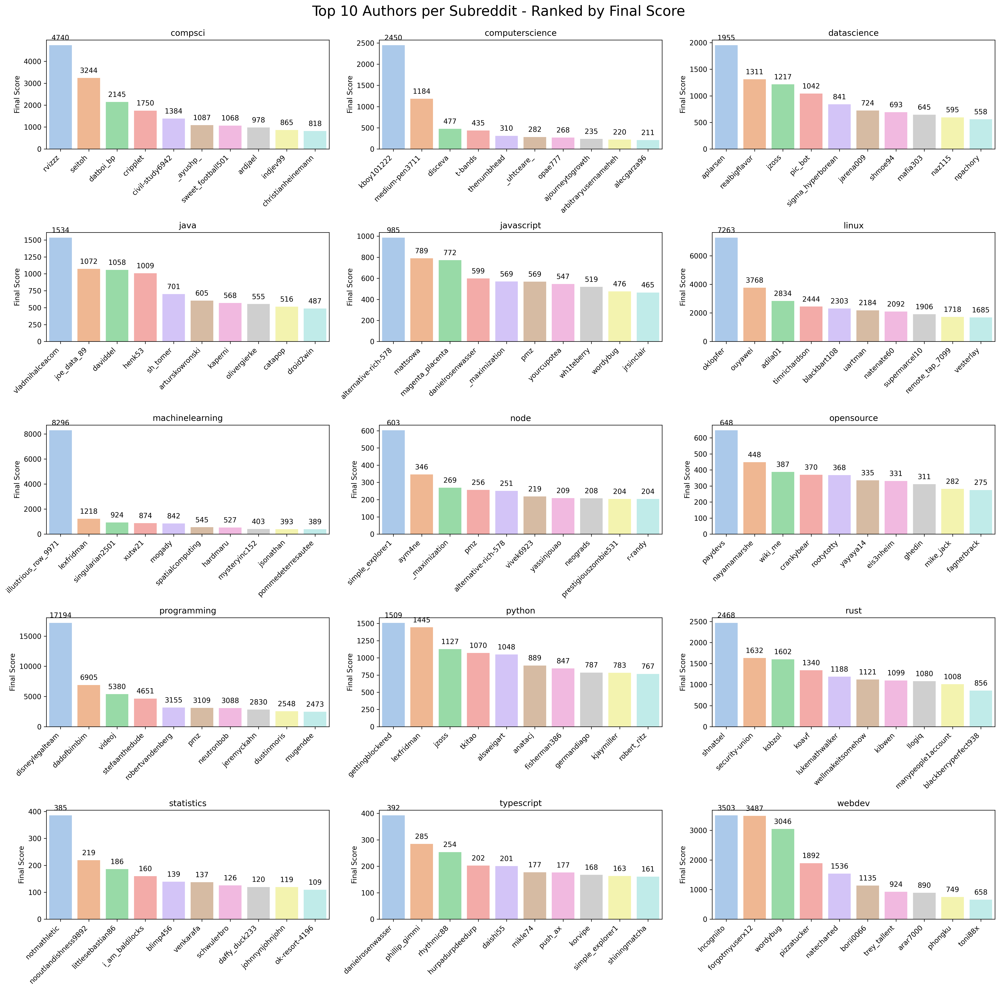

In [30]:
# Author Scoring Function
def author_scores(df):
    df_author = df[['author', 'score', 'subreddit', 'num_comments', 'upvote_ratio']]
    df_author['final_score'] = df_author['score'] * df_author['upvote_ratio'] + df_author['num_comments']
    df_author = df_author.groupby(['author', 'subreddit']).sum()
    df_author = df_author.reset_index()
    return df_author

# Plotting the top 10 authors per subreddit
top_10_authors_per_subreddit = author_scores(df).groupby('subreddit').apply(lambda x: x.nlargest(10, 'final_score'))
top_10_authors_per_subreddit = top_10_authors_per_subreddit.reset_index(drop=True)
fig, axes = plt.subplots(5, 3, figsize=(20, 20))
fig.suptitle('Top 10 Authors per Subreddit - Ranked by Final Score\n', fontsize=20)
fig.dpi = 300
for i, subreddit in enumerate(top_10_authors_per_subreddit['subreddit'].unique()):
    sns.barplot(x='author', y='final_score', data=top_10_authors_per_subreddit[top_10_authors_per_subreddit['subreddit'] == subreddit], ax=axes[i//3, i%3], palette=sns.color_palette("pastel", 10))
    for p in axes[i//3, i%3].patches:
        axes[i//3, i%3].annotate('{:1.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                                  ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
    axes[i//3, i%3].set_title(subreddit)
    axes[i//3, i%3].set_xticklabels(axes[i//3, i%3].get_xticklabels(), rotation=45, horizontalalignment='right')
    axes[i//3, i%3].set_xlabel('')
    axes[i//3, i%3].set_ylabel('Final Score')
plt.tight_layout()
plt.show()

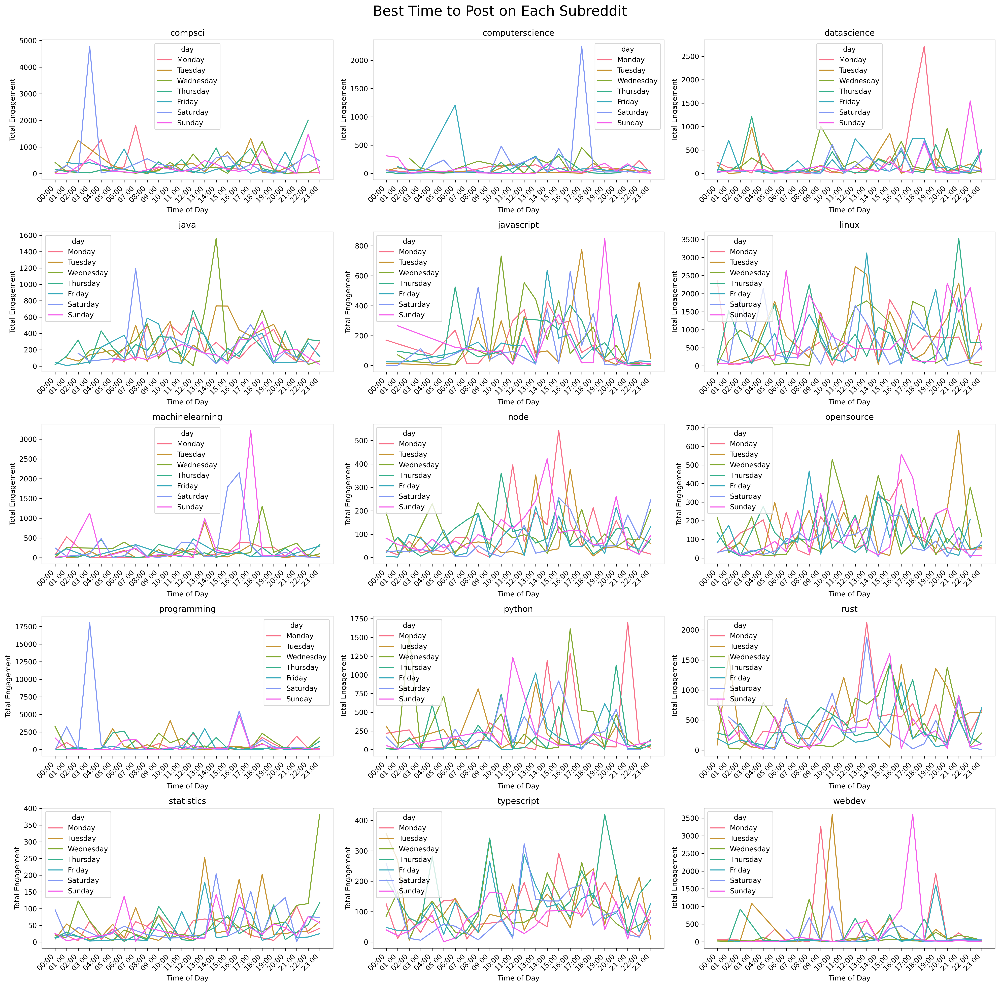

In [31]:
# Finding the best time to post on each subreddit

best_time_df = df[['subreddit', 'created_utc', 'score', 'num_comments']]
best_time_df['final_score'] = best_time_df['score'] + best_time_df['num_comments']
best_time_df.drop(['score', 'num_comments'], axis=1, inplace=True)

# Convert the created_utc column to datetime
best_time_df['created_utc'] = pd.to_datetime(best_time_df['created_utc'], unit='s')
best_time_df['day'] = best_time_df['created_utc'].dt.day_name()
best_time_df['hour'] = best_time_df['created_utc'].dt.hour
best_time_df.drop('created_utc', axis=1, inplace=True)

# Find total engagement per hour
best_time_df = best_time_df.groupby(['subreddit', 'day', 'hour']).sum()
best_time_df = best_time_df.reset_index()
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
best_time_df['day'] = pd.Categorical(best_time_df['day'], categories=days, ordered=True)

# Plotting the best time to post on each subreddit
fig, axes = plt.subplots(5, 3, figsize=(20, 20))
fig.suptitle('Best Time to Post on Each Subreddit\n', fontsize=20)
fig.dpi = 300
for i, subreddit in enumerate(best_time_df['subreddit'].unique()):
    sns.lineplot(x='hour', y='final_score', hue='day', data=best_time_df[best_time_df['subreddit'] == subreddit], ax=axes[i//3, i%3], palette=sns.color_palette("husl", 7))
    axes[i//3, i%3].set_title(subreddit)
    axes[i//3, i%3].set_xticks(range(0, 24))
    axes[i//3, i%3].set_xticklabels(list(map(lambda x: (f'0{x}:00' if x < 10 else f'{x}:00'), list(range(0, 24)))), rotation=45, horizontalalignment='right')
    axes[i//3, i%3].set_xlabel('Time of Day')
    axes[i//3, i%3].set_ylabel('Total Engagement')
plt.tight_layout()
plt.show()

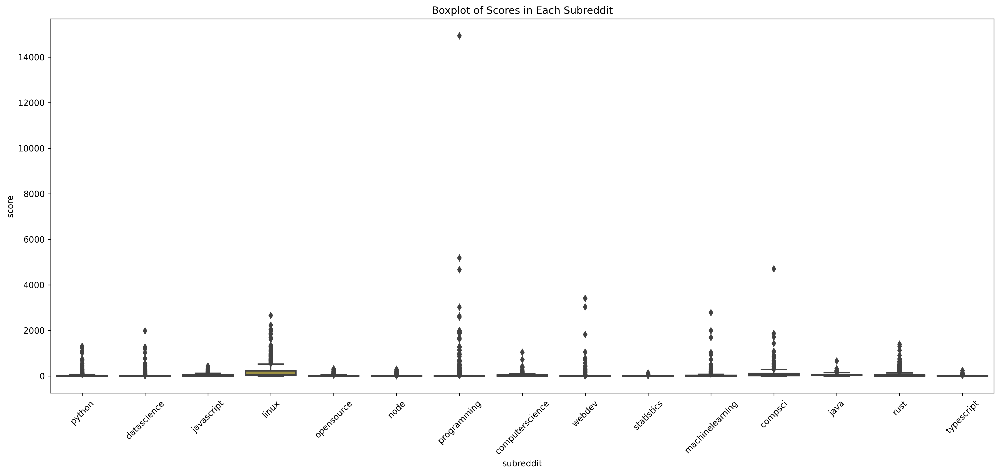

In [32]:
# Boxplot of the scores in each subreddit
plt.figure(figsize=(20, 8))
plt.rcParams['figure.dpi'] = 300
plt.title('Boxplot of Scores in Each Subreddit')
plt.xlabel('Subreddit')
plt.ylabel('Score')
plt.xticks(rotation=45)
sns.boxplot(x='subreddit', y='score', data=df, palette=sns.color_palette("husl", 15))
plt.show()

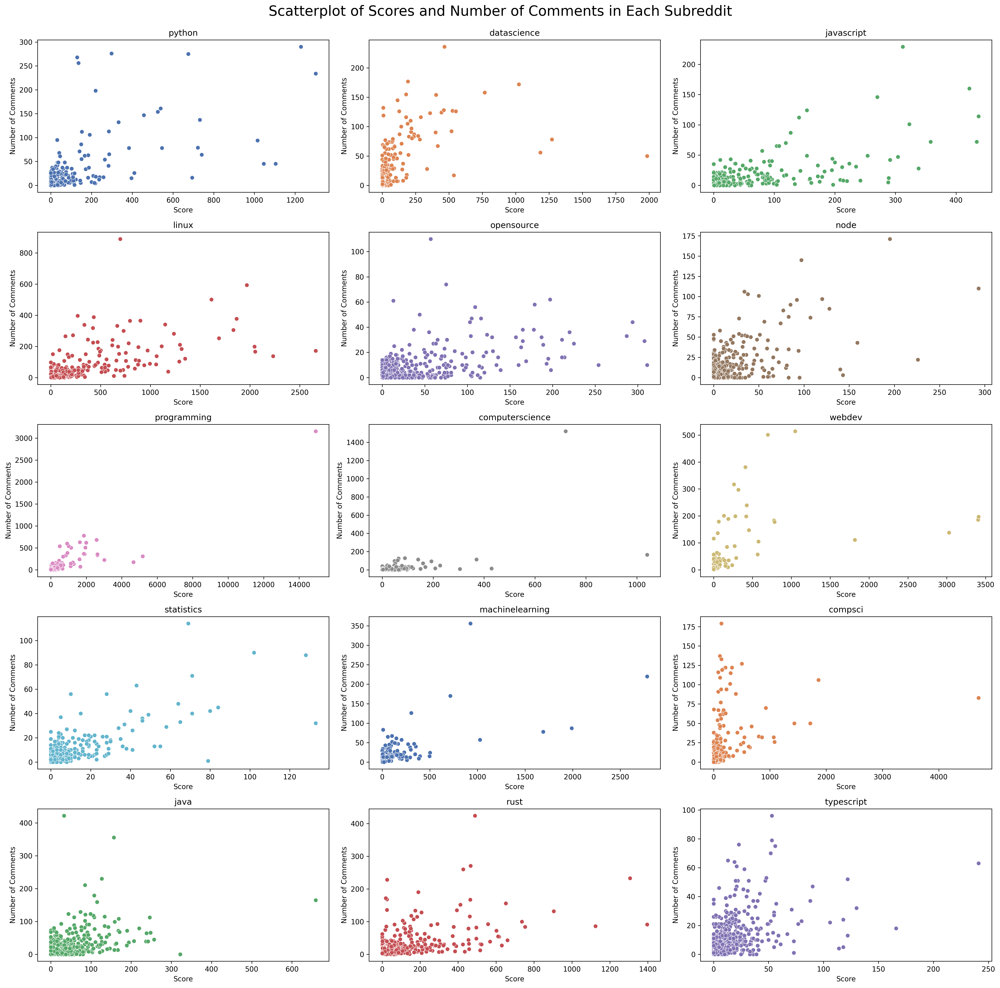

In [33]:
# Scatterplot of the scores and number of comments in each subreddit
fig, axes = plt.subplots(5, 3, figsize=(20, 20))
fig.suptitle('Scatterplot of Scores and Number of Comments in Each Subreddit\n', fontsize=20)
fig.dpi = 300
palette=sns.color_palette("deep", 15)
for i, subreddit in enumerate(df['subreddit'].unique()):
    sns.scatterplot(x='score', y='num_comments', data=df[df['subreddit'] == subreddit], ax=axes[i//3, i%3], color=palette[i])
    axes[i//3, i%3].set_title(subreddit)
    axes[i//3, i%3].set_xlabel('Score')
    axes[i//3, i%3].set_ylabel('Number of Comments')
    axes[i//3, i%3].grid(False)
plt.tight_layout()
plt.show()

In [34]:
df.columns

Index(['subreddit', 'selftext', 'gilded', 'title', 'upvote_ratio', 'ups',
       'total_awards_received', 'is_original_content',
       'is_reddit_media_domain', 'link_flair_text', 'score', 'author_premium',
       'is_self', 'no_follow', 'over_18', 'spoiler', 'locked',
       'author_flair_text', 'distinguished', 'author', 'num_comments',
       'send_replies', 'contest_mode', 'stickied', 'subreddit_subscribers',
       'created_utc', 'num_crossposts', 'is_video'],
      dtype='object')

In [35]:
# Time Features
df['created_utc'] = pd.to_datetime(df['created_utc'], unit='s')
df['hour'] = df['created_utc'].dt.hour
df['day'] = df['created_utc'].dt.day_name()
df.drop('created_utc', axis=1, inplace=True)

In [48]:
"""
We need to predict the following:
1. Upvotes
2. Number of comments
3. Upvote Ratio

We will use the following features:
1. Title
2. Body
3. Subreddit
4. Link Flair Text
5. Moderator
6. Author Premium
7. Post Time
8. Is Original Content
9. Is NSFW
10. Is Spoiler
11. Day of Week
12. Hour of Day
"""

features = ['title', 'selftext', 'subreddit', 'link_flair_text', 'distinguished', 'author_premium', 'hour', 'day', 'is_original_content', 'over_18', 'spoiler']
target = ['ups', 'num_comments']

"""
title, selftext -> text features
subreddit, link_flair_text, day, hour -> categorical features
distinguished, author_premium, is_original_content, over_18, spoiler -> binary features
"""

# Text Features
text_features = ['title', 'selftext']
df[text_features] = df[text_features].fillna('')

# Categorical Features
categorical_features = ['subreddit', 'link_flair_text']
df[categorical_features] = df[categorical_features].fillna('None')

# Binary Features
binary_features = ['distinguished', 'author_premium', 'is_original_content', 'over_18', 'spoiler']
df[binary_features] = df[binary_features].fillna(False)

# Drop columns that are not features or targets
for col in df.columns:
    if col not in features + target:
        df.drop(col, axis=1, inplace=True)

# Split the data into train and test sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df[features], df[target], test_size=0.2, random_state=42)

# Text Features
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()
X_train_text = vectorizer.fit_transform(X_train['title'] + ' ' + X_train['selftext'])
X_test_text = vectorizer.transform(X_test['title'] + ' ' + X_test['selftext'])

# Categorical Features
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(handle_unknown='ignore')
X_train_cat = encoder.fit_transform(X_train[['subreddit', 'link_flair_text', 'day']])
X_test_cat = encoder.transform(X_test[['subreddit', 'link_flair_text', 'day']])

# Binary Features
X_train_bin = X_train[binary_features].astype(int)
X_test_bin = X_test[binary_features].astype(int)

# Numerical Features
X_train_num = X_train[['hour']]
X_test_num = X_test[['hour']]

# Combine all features
from scipy.sparse import hstack

X_train = hstack([X_train_text, X_train_cat, X_train_bin, X_train_num])
X_test = hstack([X_test_text, X_test_cat, X_test_bin, X_test_num])

In [76]:
# Models: KNN, KMeans, Linear Regression, XGBoost, SVM, Decision Tree, Neural Network
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor

models = {
    'KNN': KNeighborsRegressor(),
    'KMeans': KMeans(),
    'Linear Regression': LinearRegression(),
    'XGBoost': XGBRegressor(),
    'SVM': SVR(),
    'Decision Tree': DecisionTreeRegressor(),
    'Neural Network': MLPRegressor()
}

# Train and save the models
model_folder = 'models'
import os
if not os.path.exists(model_folder):
    os.mkdir(model_folder)
import pickle

for name, model in models.items():
    for t in target:
        print(f'Training {name} for {t}...')
        model.fit(X_train, y_train[t])
        pickle.dump(model, open(f'{model_folder}/{name}_{t}.pkl', 'wb'))


Training KNN for ups...
Training KNN for num_comments...
Training KMeans for ups...
Training KMeans for num_comments...
Training Linear Regression for ups...
Training Linear Regression for num_comments...
Training XGBoost for ups...
Training XGBoost for num_comments...
Training SVM for ups...
Training SVM for num_comments...
Training Decision Tree for ups...
Training Decision Tree for num_comments...
Training Neural Network for ups...
Training Neural Network for num_comments...


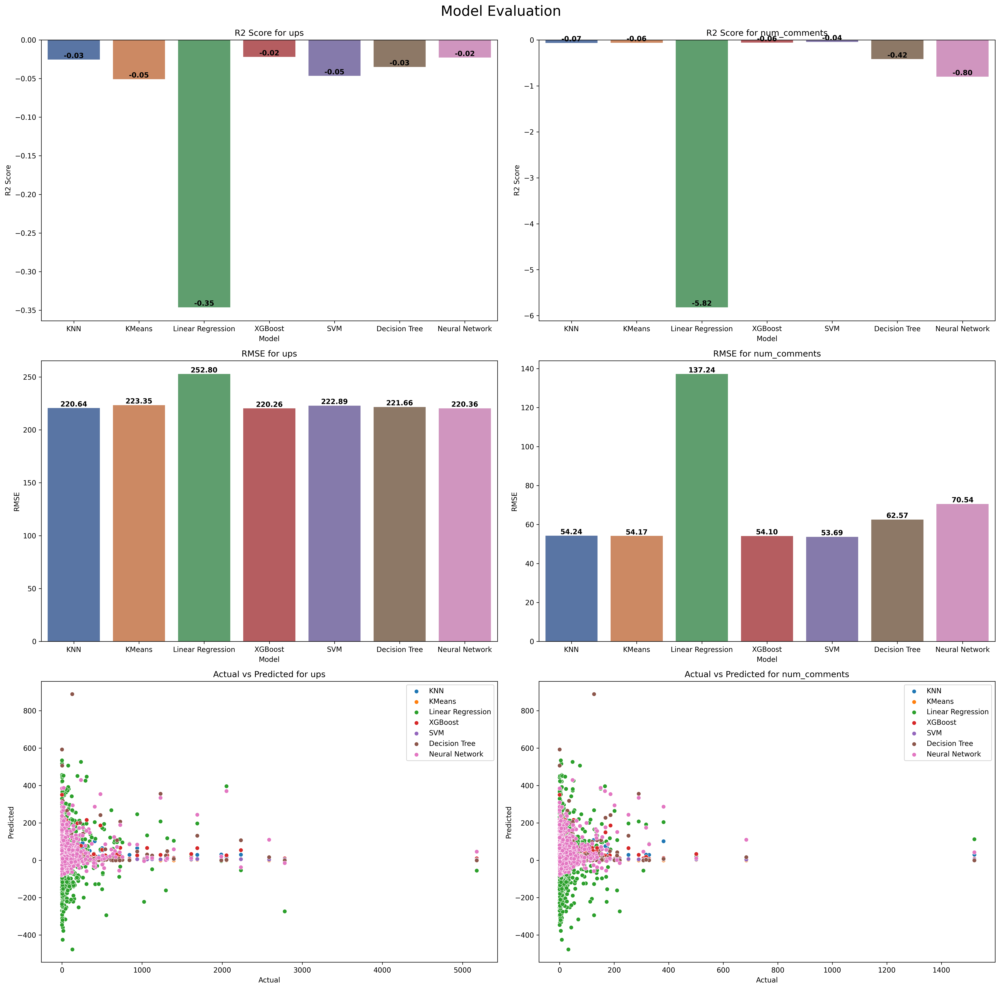

In [77]:
# Evaluate and compare the models using plots
from sklearn.metrics import mean_squared_error, r2_score

# r2 and rmse - bar plots for each target, scatter plots for each model

# Axis 0 - R2 for all models for each target
# Axis 1 - RMSE for all models for each target
# Axis 2 - Actual vs Predicted for all models for each target
# total 3 axes and 2 targets
fig, axes = plt.subplots(3, 2, figsize=(20, 20))
fig.suptitle('Model Evaluation\n', fontsize=20)
fig.dpi = 300
palette=sns.color_palette("deep", 15)

# R2
for i, t in enumerate(target):
    r2 = []
    for name, model in models.items():
        y_pred = model.predict(X_test)
        r2.append(r2_score(y_test[t], y_pred))
    sns.barplot(x=list(models.keys()), y=r2, ax=axes[0, i], palette=palette)
    axes[0, i].set_title(f'R2 Score for {t}')
    axes[0, i].set_xlabel('Model')
    axes[0, i].set_ylabel('R2 Score')
    axes[0, i].grid(False)
    for j, v in enumerate(r2):
        axes[0, i].text(j, v, f'{v:.2f}', horizontalalignment='center', verticalalignment='bottom', color='black', fontweight='bold')

# RMSE
for i, t in enumerate(target):
    rmse = []
    for name, model in models.items():
        y_pred = model.predict(X_test)
        rmse.append(mean_squared_error(y_test[t], y_pred, squared=False))
    sns.barplot(x=list(models.keys()), y=rmse, ax=axes[1, i], palette=palette)
    axes[1, i].set_title(f'RMSE for {t}')
    axes[1, i].set_xlabel('Model')
    axes[1, i].set_ylabel('RMSE')
    axes[1, i].grid(False)
    for j, v in enumerate(rmse):
        axes[1, i].text(j, v, f'{v:.2f}', horizontalalignment='center', verticalalignment='bottom', color='black', fontweight='bold')

# Actual vs Predicted
for i, t in enumerate(target):
    for j, (name, model) in enumerate(models.items()):
        y_pred = model.predict(X_test)
        sns.scatterplot(x=y_test[t], y=y_pred, ax=axes[2, i], palette=palette)
        axes[2, i].set_title(f'Actual vs Predicted for {t}')
        axes[2, i].set_xlabel('Actual')
        axes[2, i].set_ylabel('Predicted')
        axes[2, i].grid(False)
        axes[2, i].legend(list(models.keys()), loc='upper right')
plt.tight_layout()
plt.show()

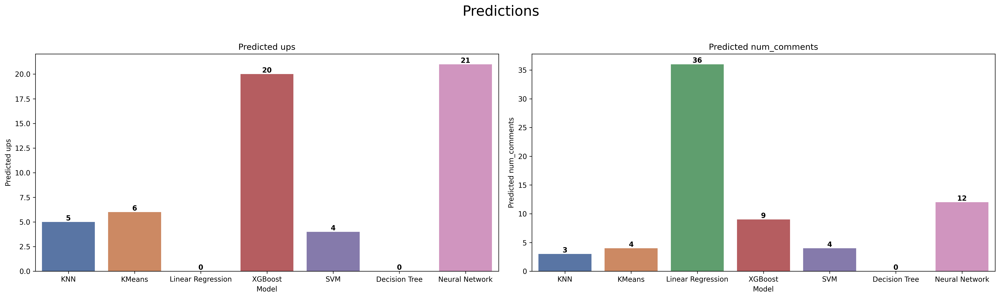

In [79]:
# Predictions for a new post

def predictor(title, selftext, subreddit, link_flair_text, distinguished, author_premium, hour, day, is_original_content, over_18, spoiler):
    # Load the models
    models = {}
    for name in ['KNN', 'KMeans', 'Linear Regression', 'XGBoost', 'SVM', 'Decision Tree', 'Neural Network']:
        for t in target:
            models[f'{name}_{t}'] = pickle.load(open(f'{model_folder}/{name}_{t}.pkl', 'rb'))
    # Text Features
    X_text = vectorizer.transform([title + ' ' + selftext])

    # Categorical Features
    X_cat = encoder.transform([[subreddit, link_flair_text, day]])

    # Binary Features
    X_bin = [[int(distinguished), int(author_premium), int(is_original_content), int(over_18), int(spoiler)]]

    # Numerical Features
    X_num = [[hour]]

    # Combine all features
    X = hstack([X_text, X_cat, X_bin, X_num])

    # Predict
    predictions = {}
    for name, model in models.items():
        predictions[name] = math.ceil(model.predict(X)[0]) if model.predict(X)[0] > 0 else 0

    return predictions

# Predictions for a new post
title = 'How to make a good post?'
selftext = 'I want to make a good post. How do I do that?'
subreddit = 'node'
link_flair_text = 'Question'
distinguished = False
author_premium = False
hour = 12
day = 'Monday'
is_original_content = False
over_18 = False
spoiler = False

predictions = predictor(title, selftext, subreddit, link_flair_text, distinguished, author_premium, hour, day, is_original_content, over_18, spoiler)

# 2 targets, 5 models - 2 bar plots
fig, axes = plt.subplots(1, 2, figsize=(20, 6))
fig.suptitle('Predictions\n', fontsize=20)
fig.dpi = 300
palette=sns.color_palette("deep", 15)

for i, t in enumerate(target):
    sns.barplot(x=list(models.keys()), y=[predictions[f'{name}_{t}'] for name in models.keys()], ax=axes[i], palette=palette)
    axes[i].set_title(f'Predicted {t}')
    axes[i].set_xlabel('Model')
    axes[i].set_ylabel(f'Predicted {t}')
    axes[i].grid(False)
    for j, v in enumerate([predictions[f'{name}_{t}'] for name in models.keys()]):
        axes[i].text(j, v, f'{v}', horizontalalignment='center', verticalalignment='bottom', color='black', fontweight='bold')
plt.tight_layout()
plt.show()